<a href="https://colab.research.google.com/github/mohdaim996/Australia_Rains_Logistic_Regression/blob/main/Rain_in_Aus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Imports


In [9]:
from sklearn.linear_model import LogisticRegression
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np  
from sklearn.model_selection import train_test_split

# Definitions

In [211]:
def log_reg(train,val):
    '''
    A function to model logistic regression using the train data 
    and print scores for train and validation
    
    return 
        trained model
    '''  
    LR = LogisticRegression(max_iter = 1000, random_state = 42)
    LR.fit(train.drop("RainTomorrow", axis=1) ,train.RainTomorrow)
    
    print("Train Scores:")
    preds = LR.predict(train.drop("RainTomorrow", axis=1))
    mdl_score(train.TARGET,preds)
    
    print("-----------------------------------------------")
    print("\nValidation scores:")
    preds_val = LR.predict(val.drop("RainTomorrow", axis=1))
    mdl_score(val.RainTomorrow,preds_val)
    return LR
def is_outlier(s):
    lower_limit = s.mean() - (s.std() * 1.7)
    upper_limit = s.mean() + (s.std() * 1.7)
    return s.between(lower_limit, upper_limit)
def vis_outlier():
  num = num_col.drop(['Day', 'Month', 'Year'])
  num_mean = {col:df[col].mean() for col in num}

  fig,axes=plt.subplots(8,2,figsize=(20,30))
  for col,i in zip(num,list(range(1,len(num)+1))):
    print((i,col))
    plt.subplot(8,2,i)
    sns.boxplot(x=df[col])

# Data

In [212]:
df = pd.read_csv('/content/weatherAUS.csv')

In [3]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df_org = df.copy()

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


# BaseLine

In [10]:
train, test =  train_test_split(df, test_size = 0.2, random_state = 42)
train, val = train_test_split(train, test_size = 0.2, random_state = 42)

In [14]:
log_reg(train,val)

ValueError: ignored

# EDA

In [26]:
df.isna().sum()/df.isna().count()*100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [8]:
df.Location.unique()

array(['Albury', 'BadgerysCreek', 'Cobar', 'CoffsHarbour', 'Moree',
       'Newcastle', 'NorahHead', 'NorfolkIsland', 'Penrith', 'Richmond',
       'Sydney', 'SydneyAirport', 'WaggaWagga', 'Williamtown',
       'Wollongong', 'Canberra', 'Tuggeranong', 'MountGinini', 'Ballarat',
       'Bendigo', 'Sale', 'MelbourneAirport', 'Melbourne', 'Mildura',
       'Nhil', 'Portland', 'Watsonia', 'Dartmoor', 'Brisbane', 'Cairns',
       'GoldCoast', 'Townsville', 'Adelaide', 'MountGambier', 'Nuriootpa',
       'Woomera', 'Albany', 'Witchcliffe', 'PearceRAAF', 'PerthAirport',
       'Perth', 'SalmonGums', 'Walpole', 'Hobart', 'Launceston',
       'AliceSprings', 'Darwin', 'Katherine', 'Uluru'], dtype=object)

In [13]:
df.Sunshine.isna().sum()

69835

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


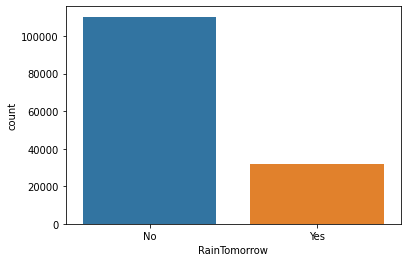

In [20]:
sns.countplot(df['RainTomorrow'])


# Cleaning and Visualization

### conversions

In [213]:
#convert to datetime object
df.Date = pd.to_datetime(df.Date)
df['Day'] = df.Date.dt.day
df['Month'] = df.Date.dt.month
df['Year'] = df.Date.dt.year
df.drop('Date',axis=1,inplace=True)
df[['Day','Month','Year']]

,Day,Month,Year
0,1,12,2008
1,2,12,2008
2,3,12,2008
3,4,12,2008
4,5,12,2008
...,...,...,...
145455,21,6,2017
145456,22,6,2017
145457,23,6,2017
145458,24,6,2017


In [32]:
# check for highest rain per month
by_month = df.groupby(['Month'])['RainTomorrow'].apply(list).reset_index().copy()
ex = pd.get_dummies(by_month['RainTomorrow'].explode())
res = pd.concat([by_month, ex.groupby(level=0).sum()], axis=1).drop('RainTomorrow', axis=1)
res.sort_values(by = 'Yes', ascending = False)

,Month,No,Yes
5,6,9145.0,3244.0
6,7,8608.0,3171.0
7,8,8792.0,2970.0
4,5,10114.0,2941.0
2,3,10255.0,2781.0
8,9,8739.0,2606.0
0,1,10423.0,2498.0
3,4,8843.0,2463.0
10,11,9025.0,2436.0
9,10,9494.0,2310.0


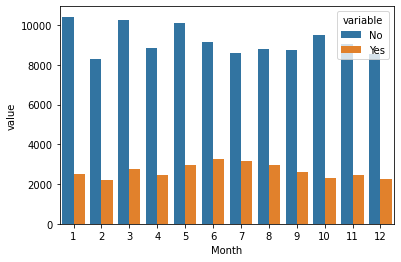

In [33]:
sns.barplot(data=pd.melt(res,'Month'), x= 'Month', y='value', hue='variable')

In [34]:
#Extract numrical columns 
num_col = df._get_numeric_data().columns
num_col

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year'],
      dtype='object')

In [35]:
#Extract categorical columns 
cat_col=list(set(df)-set(num_col))
cat_col

['WindDir9am',
 'Location',
 'WindDir3pm',
 'WindGustDir',
 'RainToday',
 'RainTomorrow']

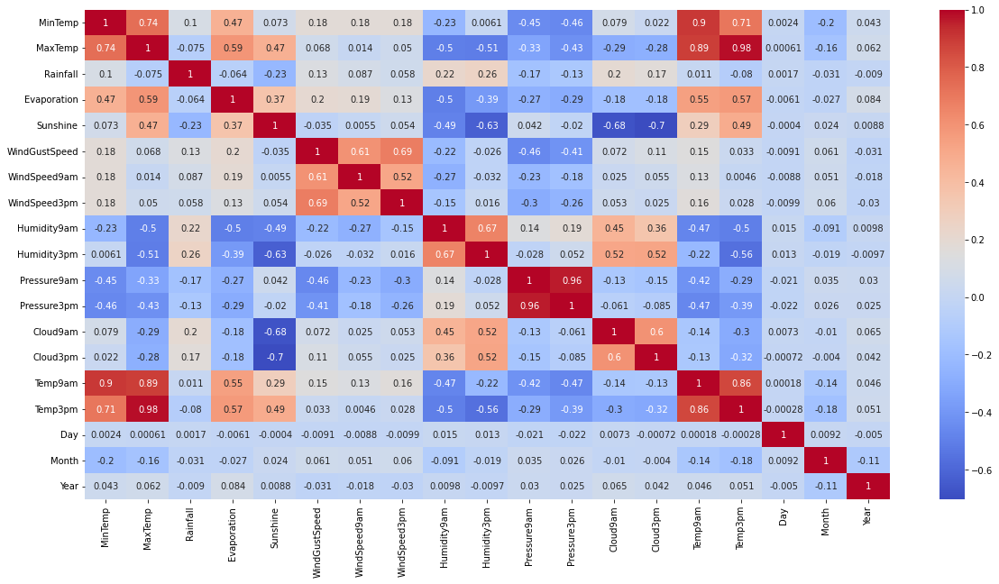

In [36]:
plt.figure(figsize=(20,10))
heatmap=sns.heatmap(df.corr(),annot=True,cmap='coolwarm')

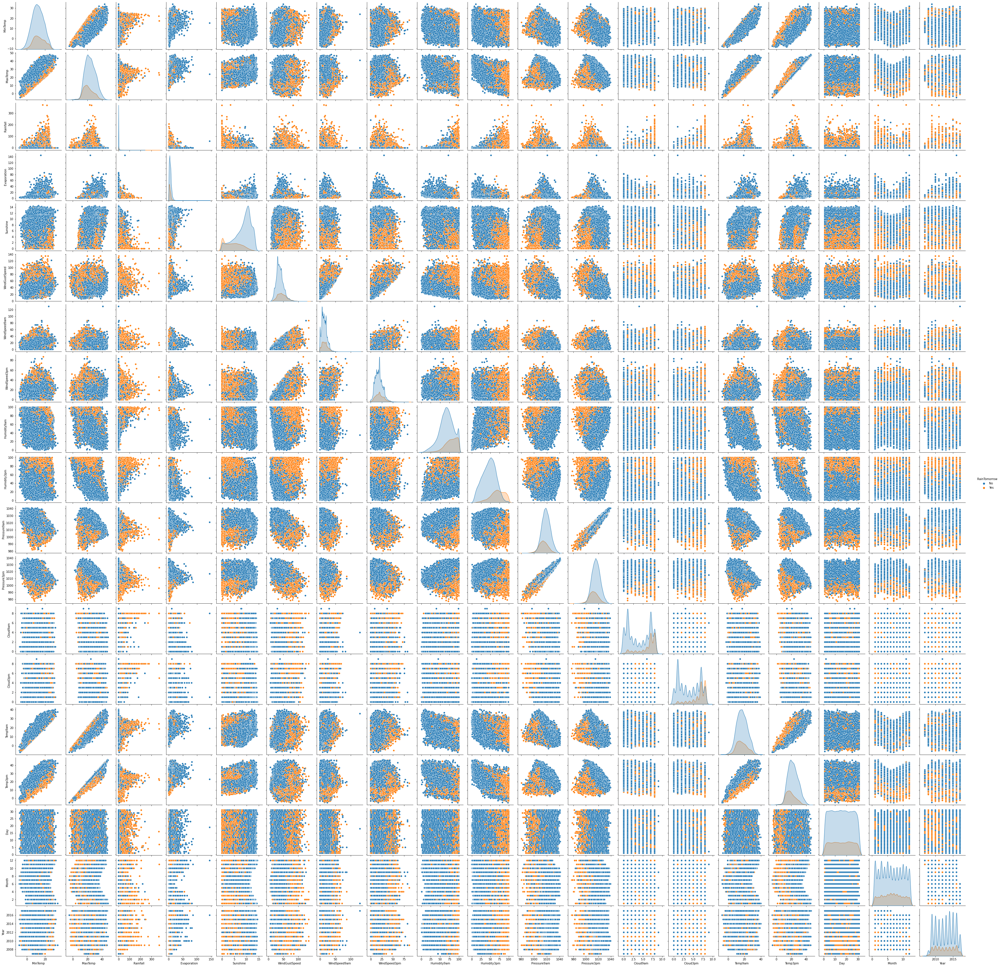

In [38]:
sns.pairplot(df, hue='RainTomorrow')

In [39]:
#save state
pd.to_pickle(df,'/content/df_1.pkl')

### Outliers

(1, 'MinTemp')
(2, 'MaxTemp')
(3, 'Rainfall')
(4, 'Evaporation')
(5, 'Sunshine')
(6, 'WindGustSpeed')
(7, 'WindSpeed9am')
(8, 'WindSpeed3pm')
(9, 'Humidity9am')
(10, 'Humidity3pm')
(11, 'Pressure9am')
(12, 'Pressure3pm')
(13, 'Cloud9am')
(14, 'Cloud3pm')
(15, 'Temp9am')
(16, 'Temp3pm')


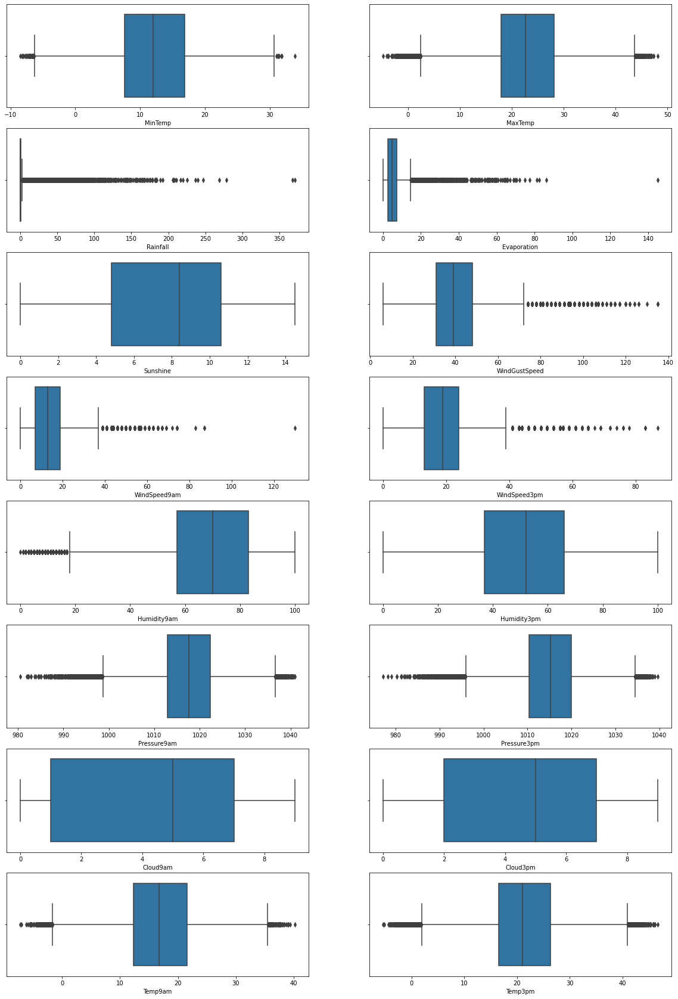

In [178]:

vis_outlier()

In [200]:
outliers = []
for col in num:
  res = is_outlier(df[col]).value_counts()
  try:
      percentage = (res[1]/res[0])*100
      print(col + " " + str(percentage))
      outliers.append(col)
  except KeyError:
    print(col)



MinTemp 54.60487856725301
MaxTemp 53.07067390663804
Rainfall 760.0993377483444
Evaporation 32.42778197576497
Sunshine 19.23146281086575
WindGustSpeed 53.785972554077766
WindSpeed9am 46.65228306128827
WindSpeed3pm 61.866820973916134
Humidity9am 59.394244888119395
Humidity3pm 53.69984889950232
Pressure9am 54.18208028152593
Pressure3pm 51.27029191235349
Cloud9am 7.371948653975331
Cloud3pm 9.10345551780263
Temp9am 54.72657454978672
Temp3pm 53.52140919693083


In [214]:
for col in outliers:
  df[col] = df[col][is_outlier(df[col])]

(1, 'MinTemp')
(2, 'MaxTemp')
(3, 'Rainfall')
(4, 'Evaporation')
(5, 'Sunshine')
(6, 'WindGustSpeed')
(7, 'WindSpeed9am')
(8, 'WindSpeed3pm')
(9, 'Humidity9am')
(10, 'Humidity3pm')
(11, 'Pressure9am')
(12, 'Pressure3pm')
(13, 'Cloud9am')
(14, 'Cloud3pm')
(15, 'Temp9am')
(16, 'Temp3pm')


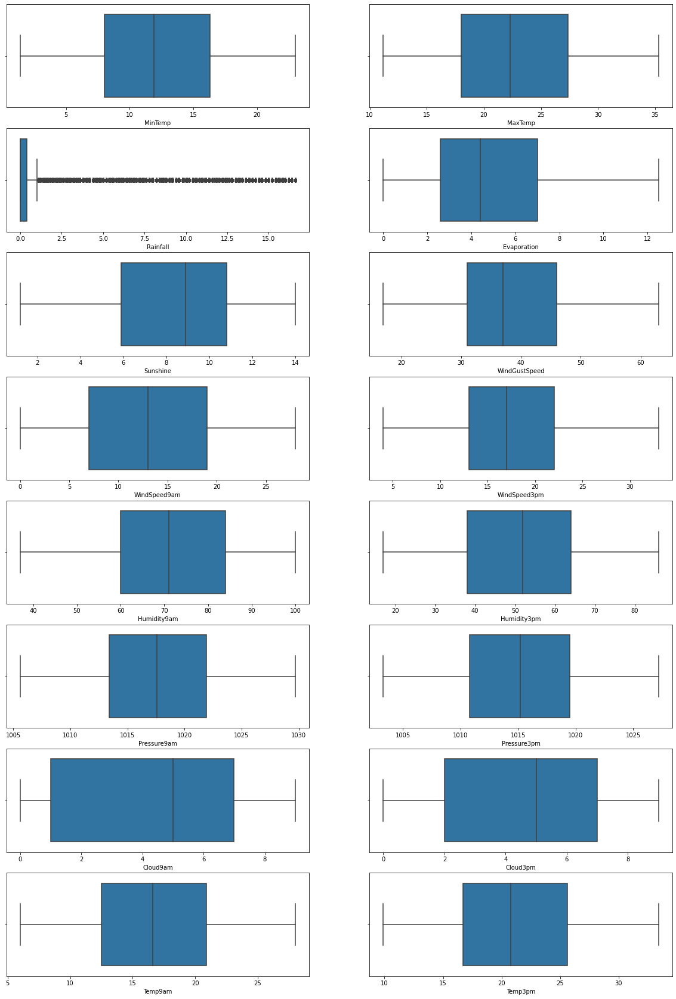

In [215]:
vis_outlier()

### NAN

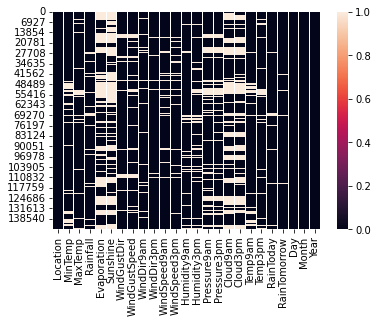

In [216]:
sns.heatmap(df.isnull())

In [217]:
df['RainToday'].fillna('No',inplace=True)
df['RainTomorrow'].fillna('No',inplace=True)

Text(0.5, 1.0, 'WindDir3pm')

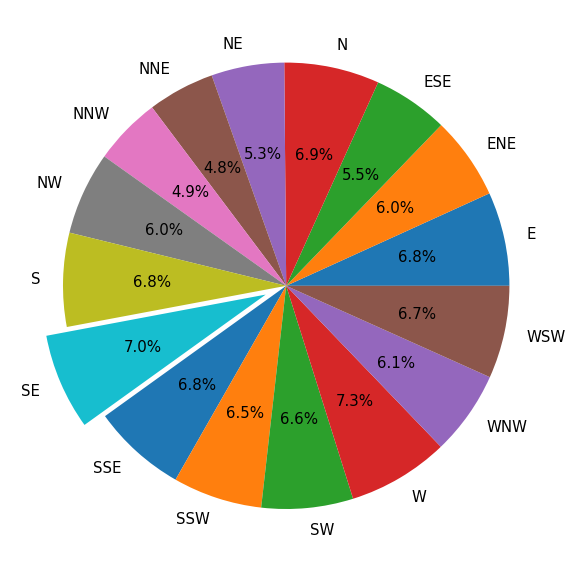

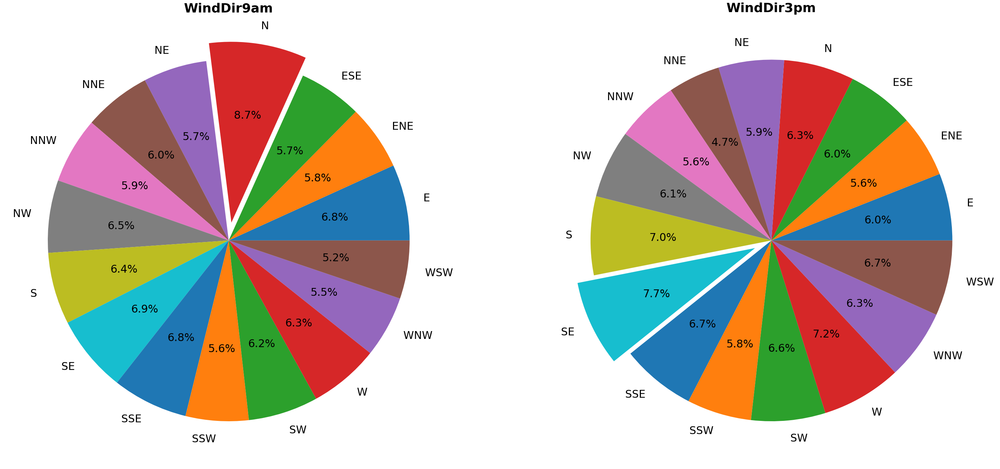

In [218]:
import matplotlib as pt
#WindGustDir
values=df.groupby('WindGustDir').Year.count()
directions=values.index
count_of_direction=list(values)
plt.subplots(figsize=(10,25))
fig=plt.pie(count_of_direction,labels=directions,explode=(0,0,0,0,0,0,0,0,0,0.1,0,0,0,0,0,0),textprops={'fontsize':15},autopct='%1.1f%%')


#WindDir9am
values_9am=df.groupby('WindDir9am').Year.count()
directions_9am=values_9am.index
count_of_direction_9am=list(values_9am)

fig,axes=plt.subplots(1,2,figsize=(50,25))
axes[0].pie(count_of_direction_9am,labels=directions_9am,autopct='%1.1f%%',explode=(0,0,0,0.1,0,0,0,0,0,0,0,0,0,0,0,0),textprops={'fontsize':30},)
axes[0].set_title('WindDir9am',fontweight='bold',fontsize=36)

#WindDir3pm
values_3pm=df.groupby('WindDir3pm').Year.count()
directions_3pm=values_3pm.index
count_of_direction_3pm=list(values_3pm)

axes[1].pie(count_of_direction_3pm,labels=directions_3pm,explode=(0,0,0,0,0,0,0,0,0,0.1,0,0,0,0,0,0),textprops={'fontsize':30},autopct='%1.1f%%')
axes[1].set_title('WindDir3pm',fontweight='bold',fontsize=36)




In [219]:
df['WindGustDir'].fillna('SE',inplace=True)
df['WindDir9am'].fillna('N',inplace=True)
df['WindDir3pm'].fillna('SE',inplace=True)

In [220]:
for col in df.columns:
  if df[col].dtype == 'float64' and df[col].isna().sum()>0:
    df[col].fillna(df[col].mean(),inplace=True)

In [221]:
values=df.groupby('WindGustDir').Year.count()
directions=values.index
count_of_direction=list(values)

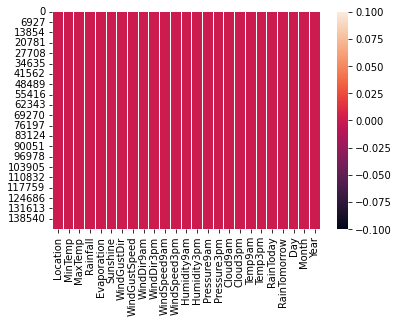

In [222]:
sns.heatmap(df.isnull())

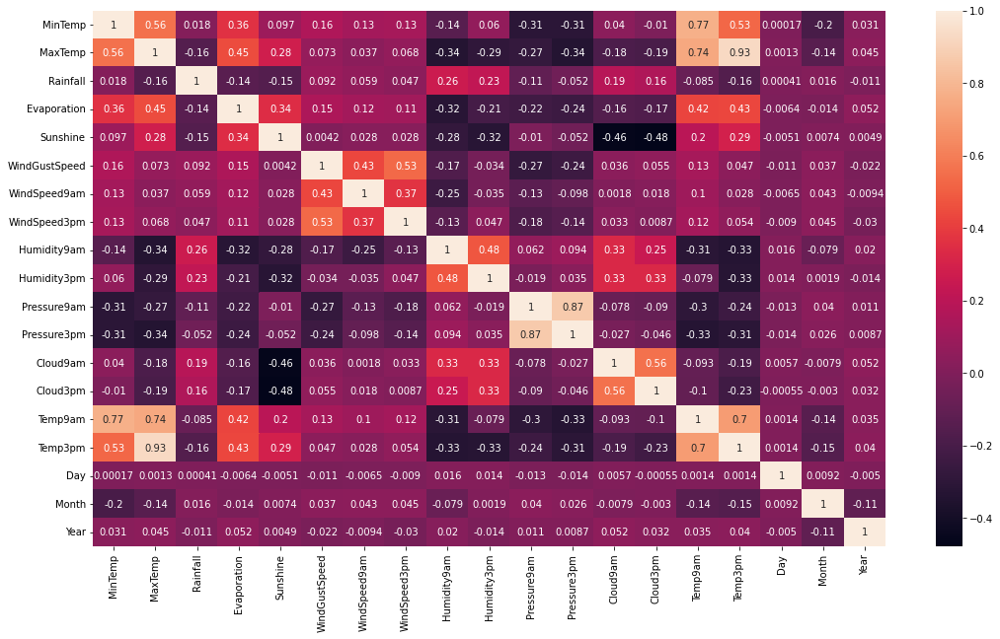

In [223]:
plt.figure(figsize=(18,10))
sns.heatmap(df[num_col].corr(),annot=True)